In [287]:
# dataset @ https://finance.yahoo.com/quote/MSFT/history/

# If you want the exact same dataset as the YouTube video,
# use this link: https://drive.google.com/file/d/1WLm1AEYgU28Nk4lY4zNkGPSctdImbhJI/view?usp=sharing

In [288]:
import pandas as pd
import os
from sklearn.metrics import mean_absolute_error
import numpy as np
from keras import Sequential
import keras
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import os
import yfinance as yf
Stock = "MS"
if os.path.exists(Stock + ".csv"):
    df = pd.read_csv(Stock + ".csv", index_col=0)
else:
    df = yf.Ticker(Stock)
    df = df.history(period="max")
    df.to_csv(Stock + ".csv")
df = pd.read_csv(Stock + '.csv')

df

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,1993-02-23 00:00:00-05:00,3.705273,3.763168,3.546062,3.589483,40594800,0.0,0.0
1,1993-02-24 00:00:00-05:00,3.647378,3.734220,3.603957,3.690799,9426400,0.0,0.0
2,1993-02-25 00:00:00-05:00,3.705273,3.777642,3.690800,3.777642,5229200,0.0,0.0
3,1993-02-26 00:00:00-05:00,3.777644,3.835539,3.719749,3.835539,2761200,0.0,0.0
4,1993-03-01 00:00:00-05:00,3.792117,3.806591,3.705275,3.705275,3014400,0.0,0.0
...,...,...,...,...,...,...,...,...
7939,2024-09-04 00:00:00-04:00,99.739998,101.320000,99.680000,100.150002,4212500,0.0,0.0
7940,2024-09-05 00:00:00-04:00,101.000000,101.300003,99.120003,99.559998,4462400,0.0,0.0
7941,2024-09-06 00:00:00-04:00,99.699997,100.800003,96.139999,96.589996,9246800,0.0,0.0
7942,2024-09-09 00:00:00-04:00,97.760002,99.019997,97.599998,98.180000,5278900,0.0,0.0


In [289]:
import datetime

def str_to_datetime(s):
  split = s.split('-')
  split2 = split[2].split(' ')
  year, month, day = int(split[0]), int(split[1]), int(split2[0])
  return datetime.datetime(year=year, month=month, day=day)

df['Date'] = df['Date'].apply(str_to_datetime)
train_dates = df['Date']

In [290]:
cols = list(df)[1:6]
cols
df_for_training = df[cols].astype(float)
df_for_training

,Open,High,Low,Close,Volume
0,3.705273,3.763168,3.546062,3.589483,40594800.0
1,3.647378,3.734220,3.603957,3.690799,9426400.0
2,3.705273,3.777642,3.690800,3.777642,5229200.0
3,3.777644,3.835539,3.719749,3.835539,2761200.0
4,3.792117,3.806591,3.705275,3.705275,3014400.0
...,...,...,...,...,...
7939,99.739998,101.320000,99.680000,100.150002,4212500.0
7940,101.000000,101.300003,99.120003,99.559998,4462400.0
7941,99.699997,100.800003,96.139999,96.589996,9246800.0
7942,97.760002,99.019997,97.599998,98.180000,5278900.0


In [291]:
scaler = StandardScaler()
scaler = scaler.fit(df_for_training)
df_for_training_scaled = scaler.transform(df_for_training)
print(df_for_training_scaled)

[[-1.23898219 -1.24309377 -1.23896816 -1.24419278  2.65938015]
 [-1.24157086 -1.24437517 -1.23635377 -1.23966304 -0.04572533]
 [-1.23898217 -1.24245305 -1.23243217 -1.23578038 -0.41000032]
 ...
 [ 3.05324605  3.05236606  2.94234382  2.9137687  -0.06131281]
 [ 2.96650274  2.9735718   3.00827375  2.98485621 -0.40568686]
 [ 2.99511914  2.94745486  2.88589693  2.88649651 -0.48287077]]


In [292]:

df_as_np = df.to_numpy()
dates = df_as_np[:, 0]
dates

array([Timestamp('1993-02-23 00:00:00'), Timestamp('1993-02-24 00:00:00'),
       Timestamp('1993-02-25 00:00:00'), ...,
       Timestamp('2024-09-06 00:00:00'), Timestamp('2024-09-09 00:00:00'),
       Timestamp('2024-09-10 00:00:00')], dtype=object)

In [301]:
X = []
Y = []

n_future = 1   # Number of days we want to look into the future based on the past days.
n_past = 14  # Number of past days we want to use to predict the future.

#Reformat input data into a shape: (n_samples x timesteps x n_features)
#In my example, my df_for_training_scaled has a shape (12823, 5)
#12823 refers to the number of data points and 5 refers to the columns (multi-variables).
for i in range(n_past, len(df_for_training_scaled) - n_future +1):
    X.append(df_for_training_scaled[i - n_past:i, 0:df_for_training.shape[1]])
    Y.append(df_for_training_scaled[i + n_future - 1:i + n_future, 0])

X, Y = np.array(X), np.array(Y)

print('X shape == {}.'.format(X.shape))
print('Y shape == {}.'.format(Y.shape))
np.set_printoptions(threshold=np.inf)

print(X)
print(Y)



X shape == (7930, 14, 5).
Y shape == (7930, 1).
[[[-1.23898219e+00 -1.24309377e+00 -1.23896816e+00 -1.24419278e+00
    2.65938015e+00]
  [-1.24157086e+00 -1.24437517e+00 -1.23635377e+00 -1.23966304e+00
   -4.57253251e-02]
  [-1.23898217e+00 -1.24245305e+00 -1.23243217e+00 -1.23578038e+00
   -4.10000319e-01]
  [-1.23574627e+00 -1.23989019e+00 -1.23112490e+00 -1.23319188e+00
   -6.24198042e-01]
  [-1.23509912e+00 -1.24117160e+00 -1.23177852e+00 -1.23901586e+00
   -6.02222814e-01]
  [-1.23768776e+00 -1.24053088e+00 -1.23112489e+00 -1.23448609e+00
   -6.01493778e-01]
  [-1.23509915e+00 -1.23924953e+00 -1.22916415e+00 -1.23513325e+00
   -6.20066838e-01]
  [-1.23574634e+00 -1.24053096e+00 -1.22851058e+00 -1.23578038e+00
   -7.09043948e-01]
  [-1.23639348e+00 -1.23860883e+00 -1.23177854e+00 -1.23254482e+00
   -5.28069437e-01]
  [-1.23380477e+00 -1.23924949e+00 -1.22785691e+00 -1.23319188e+00
   -6.45478951e-01]
  [-1.23380487e+00 -1.23284261e+00 -1.22654982e+00 -1.22801514e+00
   -6.51276523e

In [294]:
df 

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,1993-02-23,3.705273,3.763168,3.546062,3.589483,40594800,0.0,0.0
1,1993-02-24,3.647378,3.734220,3.603957,3.690799,9426400,0.0,0.0
2,1993-02-25,3.705273,3.777642,3.690800,3.777642,5229200,0.0,0.0
3,1993-02-26,3.777644,3.835539,3.719749,3.835539,2761200,0.0,0.0
4,1993-03-01,3.792117,3.806591,3.705275,3.705275,3014400,0.0,0.0
...,...,...,...,...,...,...,...,...
7939,2024-09-04,99.739998,101.320000,99.680000,100.150002,4212500,0.0,0.0
7940,2024-09-05,101.000000,101.300003,99.120003,99.559998,4462400,0.0,0.0
7941,2024-09-06,99.699997,100.800003,96.139999,96.589996,9246800,0.0,0.0
7942,2024-09-09,97.760002,99.019997,97.599998,98.180000,5278900,0.0,0.0


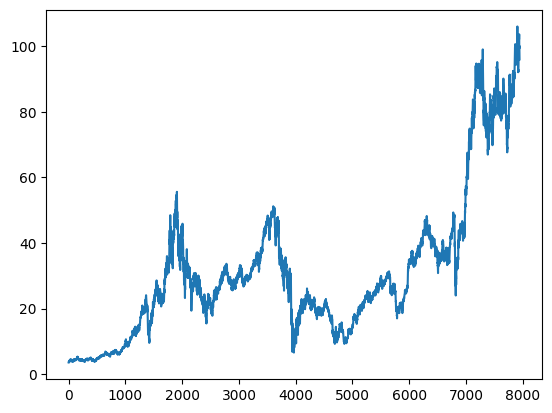

In [295]:
import matplotlib.pyplot as plt

plt.plot(df.index, df['Close'])

<!-- Basicelly we do this : [Target-3, Target-2, Target-1] --> [Target]

(7930, 14, 5)
(7930, 1)
(7944,)


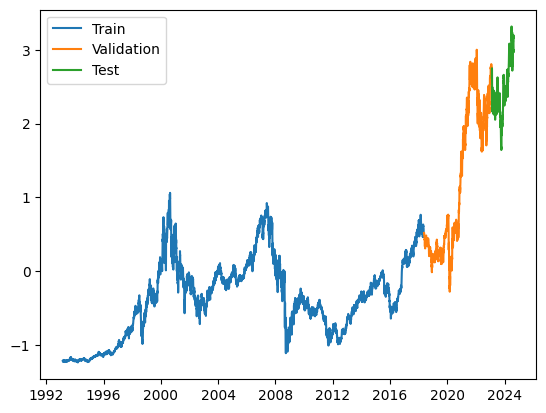

In [296]:
q_80 = int(len(dates) * .8)
q_90 = int(len(dates) * .95)
print(X.shape)
print(Y.shape)
print(dates.shape)
dates_train, X_train, y_train = dates[:q_80], X[:q_80], Y[:q_80]

dates_val, X_val, y_val = dates[q_80:q_90], X[q_80:q_90], Y[q_80:q_90]
dates_test, X_test, y_test = dates[q_90:], X[q_90:], Y[q_90:]

plt.plot(dates_train, y_train)
plt.plot(dates_val, y_val)
plt.plot(dates_test[:-n_past], y_test)

plt.legend(['Train', 'Validation', 'Test'])

In [297]:
from keras import layers
import keras
model = Sequential()
model.add(layers.LSTM(64, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model.add(layers.LSTM(32, activation='relu', return_sequences=False))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(y_train.shape[1]))

model.compile(optimizer='adam', loss='mse')
model.summary()


# fit the model
history = model.fit(X_train, y_train, validation_data=(X_val,y_val),epochs=20, batch_size=16, validation_split=0.1, verbose=1)



c:\Users\guera\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_26 (LSTM)                  │ (None, 14, 64)         │        17,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_27 (LSTM)                  │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 30,369 (118.63 KB)

 Trainable params: 30,369 (118.63 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
398/398 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 0.0521 - val_loss: 0.7039
Epoch 2/20
398/398 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.0114 - val_loss: 1.6977
Epoch 3/20
398/398 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0112 - val_loss: 1.6124
Epoch 4/20
398/398 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0096 - val_loss: 1.0649
Epoch 5/20
398/398 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0099 - val_loss: 0.9409
Epoch 6/20
398/398 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0088 - val_loss: 0.5906
Epoch 7/20
398/398 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0079 - val_loss: 0.2615
Epoch 8/20
398/398 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.0088 - val_loss: 0.0587
Epoch 9/20
398/398 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0087 - val_loss: 0.3074
Epoch 10/20
398/398 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0081 - val_loss: 0.0634
Epoch 11/20
398/398 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0080 - val_loss: 0.1091
Epoch 12/20
398/398 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/st

199/199 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
[[-1.13867915e+00]
 [-1.13675892e+00]
 [-1.13860941e+00]
 [-1.13889456e+00]
 [-1.13652813e+00]
 [-1.13579428e+00]
 [-1.13574231e+00]
 [-1.13762152e+00]
 [-1.14046109e+00]
 [-1.14075446e+00]
 [-1.13590515e+00]
 [-1.13324833e+00]
 [-1.12895489e+00]
 [-1.12606883e+00]
 [-1.12846291e+00]
 [-1.13190913e+00]
 [-1.13273752e+00]
 [-1.13309038e+00]
 [-1.13304818e+00]
 [-1.13302159e+00]
 [-1.13157320e+00]
 [-1.12804163e+00]
 [-1.12446976e+00]
 [-1.12672830e+00]
 [-1.12711120e+00]
 [-1.12911189e+00]
 [-1.13306606e+00]
 [-1.13458824e+00]
 [-1.13625896e+00]
 [-1.13818038e+00]
 [-1.14108586e+00]
 [-1.14258540e+00]
 [-1.14031148e+00]
 [-1.13973510e+00]
 [-1.13378096e+00]
 [-1.13114178e+00]
 [-1.13068628e+00]
 [-1.13120818e+00]
 [-1.13198221e+00]
 [-1.13175666e+00]
 [-1.13091707e+00]
 [-1.13064218e+00]
 [-1.13017273e+00]
 [-1.13193464e+00]
 [-1.13579202e+00]
 [-1.13517261e+00]
 [-1.13637483e+00]
 [-1.13554811e+00]
 [-1.13667095e+00]
 [-1.13961327e+00]
 [-1.1397

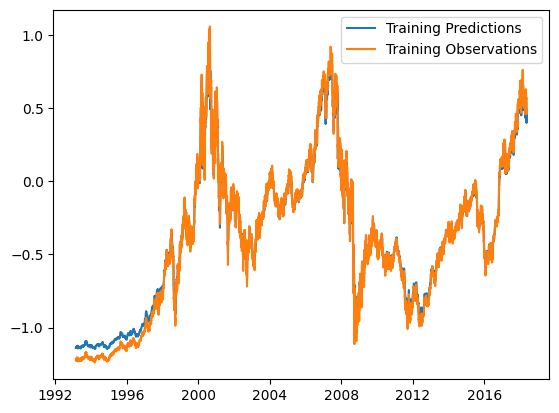

In [321]:
train_predictions = model.predict(X_train)



plt.plot(dates_train, train_predictions)
print(train_predictions)
plt.plot(dates_train, y_train)
print(y_train)
plt.legend(['Training Predictions', 'Training Observations'])
print(mean_absolute_error(y_train , train_predictions))

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
4.19870149991737


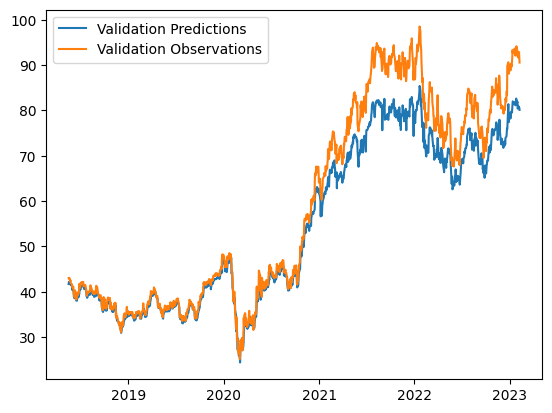

In [325]:


val_predictions = model.predict(X_val)
val_predictions = np.repeat(val_predictions, 5, axis=-1)
val_predictions = scaler.inverse_transform(val_predictions)[:, 0]

y_val = np.repeat(y_val, 5, axis=-1)
y_val = scaler.inverse_transform(y_val)[:, 0]
plt.plot(dates_val, val_predictions)
plt.plot(dates_val, y_val)
plt.legend(['Validation Predictions', 'Validation Observations'])
print(mean_absolute_error(y_val , val_predictions))   #Doit être le plus faible possible 

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
[[[ 2.7822963   2.75966184  2.76596131  2.73252138 -0.43129859]
  [ 2.71351213  2.70952923  2.75871588  2.7489772  -0.41037352]
  [ 2.75022484  2.75799035  2.7842867   2.79074966 -0.43767765]
  [ 2.77512229  2.80937585  2.81880727  2.83842968 -0.19733878]
  [ 2.79453404  2.80812299  2.84139518  2.84982286 -0.30281467]
  [ 2.8059274   2.77804341  2.81198848  2.79665722 -0.33860686]
  [ 2.7687926   2.76885236  2.79025344  2.79412556 -0.15797951]
  [ 2.75022538  2.72624034  2.74252142  2.71437778 -0.29484735]
  [ 2.70422867  2.68738748  2.71865512  2.69960906 -0.42360899]
  [ 2.72574962  2.7020092   2.72206418  2.72787965 -0.35038427]
  [ 2.69494475  2.68362755  2.71822869  2.71775265 -0.39394417]
  [ 2.74811518  2.70451602  2.71695021  2.67555791 -0.37391304]
  [ 2.69367913  2.65480166  2.70331274  2.66711937 -0.278418  ]
  [ 2.64472852  2.63265995  2.66069471  2.6540391  -0.3926076 ]]

 [[ 2.71351213  2.70952923  2.75871588  2.7489772  -0.41037352

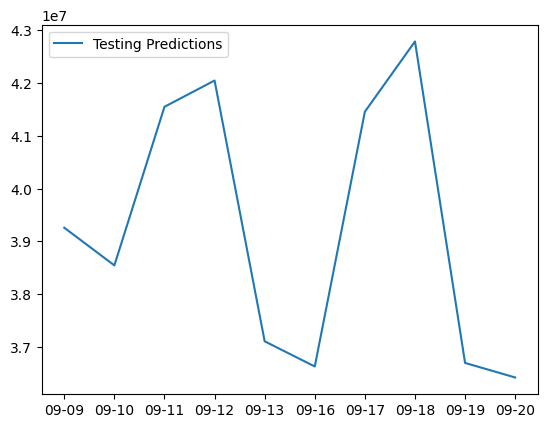

In [331]:
test_predictions = model.predict(X_test).flatten()
print(X_test)
Number_of_days = 10
first_lst = X[-2:]
print(first_lst)

def Predict_the_future(model,X2,n,array,i) : 
    if n == 0 : 
        return array , X2
    else : 
        X_2 = np.ndarray.copy(X2[i])
        X_2 = np.roll(X_2,-1,axis=0)
        print(model.predict(np.array([X_2])))
        X_2[-1] = model.predict(np.array([X_2]))
        
        result = np.vstack([X2,np.array([X_2])])
        return Predict_the_future(model,result,n-1,np.vstack((array,X_2[-1])),i+1)



f_result, X2=  Predict_the_future(model,first_lst,Number_of_days,np.empty((0, 5)),0)
vrai_result = scaler.inverse_transform(f_result)[:,-1]
# print(vrai_result)
def generate_timestamps(start_date, periods):
    # Générer une série de dates en excluant les weekends (jours ouvrés)
    dates = pd.bdate_range(start=start_date, periods=periods)  # bdate_range génère des jours ouvrés
    timestamps = [pd.Timestamp(date) for date in dates]
    return timestamps

def generate_timestamps2(start_date, periods):
    # Générer une série de dates en excluant les weekends (jours ouvrés)
    dates = pd.bdate_range(start=start_date, periods=periods)  # bdate_range génère des jours ouvrés
    timestamps = [date.strftime("%m-%d") for date in dates]  # Format MM-JJ (mois-jour)
    return timestamps

start_date = '2024-09-09'
num_dates = Number_of_days  # Number of dates you want
dates_array = generate_timestamps(start_date, num_dates)
dates_array2 = generate_timestamps2(start_date, num_dates)

print(f"The value of the action tomorrow will be {f_result[0]}")
print(f"The value of the action in 5 days will be {f_result[-1]}")
plt.plot(dates_array2 , vrai_result)

# plt.plot(dates_array, test_predictions)
# plt.plot(dates_array, y_test)
plt.legend(['Testing Predictions', 'Testing Observations'])
plt.savefig('mon_plot.png')


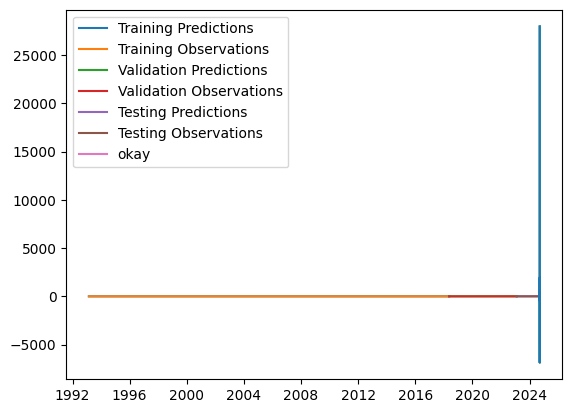

In [257]:
plt.plot(dates_train, train_predictions)
plt.plot(dates_train, y_train)
plt.plot(dates_val, val_predictions)
plt.plot(dates_val, y_val)
plt.plot(dates_test[:-n_past], test_predictions)
plt.plot(dates_test[:-n_past], y_test)
plt.plot(dates_array, f_result)
plt.legend(['Training Predictions',
            'Training Observations',
            'Validation Predictions',
            'Validation Observations',
            'Testing Predictions',
            'Testing Observations','okay'])
plt.savefig('okay')

In [258]:
from copy import deepcopy

from copy import deepcopy

recursive_predictions = []
recursive_dates = np.concatenate([dates_val, dates_test])
last_window = deepcopy(X_train[-1])

for target_date in recursive_dates:
    next_prediction = model.predict(np.array([last_window])).flatten()
    recursive_predictions.append(next_prediction)
    last_window = np.concatenate([last_window[1:], [next_prediction]])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


ValueError: all the input array dimensions except for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 5 and the array at index 1 has size 1

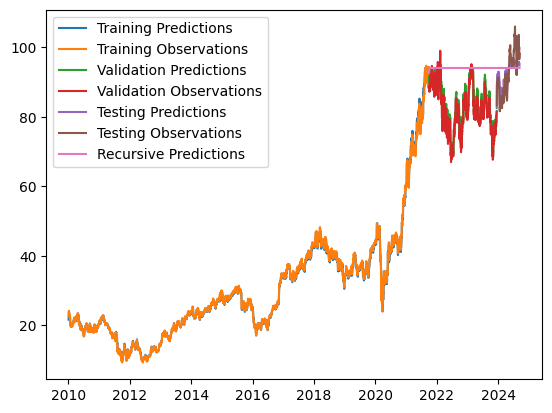

In [115]:
plt.plot(dates_train, train_predictions)
plt.plot(dates_train, y_train)
plt.plot(dates_val, val_predictions)
plt.plot(dates_val, y_val)
plt.plot(dates_test, test_predictions)
plt.plot(dates_test, y_test)
plt.plot(recursive_dates, recursive_predictions)
plt.legend(['Training Predictions',
            'Training Observations',
            'Validation Predictions',
            'Validation Observations',
            'Testing Predictions',
            'Testing Observations',
            'Recursive Predictions'])
plt.savefig('mon_plot.png')
